# **Import Dependencies¶**


In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
plt.style.use('ggplot')

import os
import random
import cv2

# !pip install tensorflow
import tensorflow as tf
import keras
from tqdm import tqdm

from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
#from tensorflow.keras.applications import VGG19
from tensorflow.keras.optimizers import Adam, Adamax, AdamW
from tensorflow.keras import regularizers

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings('ignore')



# **Define Data Path¶**


In [ ]:
#data_path = '/kaggle/input/brain-tumor-mri-images-44c/'
from google.colab import drive
drive.mount('/content/drive')
data_path = '/content/drive/My Drive/Brain_tumor_15/dataset'


Mounted at /content/drive


# **Read the Dataset and Visualize the classes**

In [ ]:
def main(train_data_path):

    for dirs in [train_data_path]:

        filepaths = []
        labels = []
        classes_list = sorted(os.listdir(dirs))
        filepaths,labels = get_fileList(classes_list, dirs, filepaths, labels)
        train_df = obtain_train_df(filepaths, labels)

    return train_df


def get_fileList(classes_list, dirs, filepaths, labels):

    for s_class in classes_list:

        label = s_class
        classpath = os.path.join(dirs, s_class)
        flist = sorted(os.listdir(classpath))

        store_image_names_and_its_labels(flist, classpath, filepaths, labels, label)

    return filepaths, labels


def store_image_names_and_its_labels(flist, classpath, filepaths, labels, label):

    for file in flist:
        file_path = os.path.join(classpath, file)
        filepaths.append(file_path)
        labels.append(label)



def obtain_train_df(filepaths, labels):

    train_df =pd.DataFrame({
        'image_path' : filepaths,
        'label' : labels
    })
    return train_df

In [ ]:

"""
% Alternative way to read the dataset as function main
categories = os.listdir(data_path)
#categories

images = []
labels = []

for folder in categories:
    folder_path = os.path.join((data_path), folder)
    for image_filename in os.listdir(folder_path):
        image_path = os.path.join(folder_path, image_filename)
        images.append(image_path)
        labels.append(folder)
df = pd.DataFrame({'image': images, 'label': labels})
df
"""

"\n% Alternative way to read the dataset as function main\ncategories = os.listdir(data_path)\n#categories\n\nimages = []\nlabels = []\n\nfor folder in categories:\n    folder_path = os.path.join((data_path), folder)\n    for image_filename in os.listdir(folder_path):\n        image_path = os.path.join(folder_path, image_filename)\n        images.append(image_path)\n        labels.append(folder)\ndf = pd.DataFrame({'image': images, 'label': labels})\ndf\n"

In [ ]:
data_df = main(data_path)
data_df.head()

,image_path,label
0,/content/drive/My Drive/Brain_tumor_15/dataset...,Astrocitoma T1
1,/content/drive/My Drive/Brain_tumor_15/dataset...,Astrocitoma T1
2,/content/drive/My Drive/Brain_tumor_15/dataset...,Astrocitoma T1
3,/content/drive/My Drive/Brain_tumor_15/dataset...,Astrocitoma T1
4,/content/drive/My Drive/Brain_tumor_15/dataset...,Astrocitoma T1


In [ ]:
num_classes = len(data_df['label'].unique())
print(f"There are {num_classes} Folders")
print(f"There are {data_df.shape[0]} images")
data_df['label'].value_counts()

There are 44 Folders
There are 4479 images


,count
label,
Meningioma T1C+,369
Meningioma T1,272
NORMAL T2,271
NORMAL T1,251
Astrocitoma T1C+,233
Meningioma T2,233
Neurocitoma T1C+,223
Schwannoma T1C+,194
Astrocitoma T1,176


**Data is imbalanced**

# **Split the data into train, test and val dataframes**

In [ ]:
# Generate data paths with labels
def define_paths(dir):
    filepaths = []
    labels = []

    folds = os.listdir(dir)
    for fold in folds:
        foldpath = os.path.join(dir, fold)
        filelist = os.listdir(foldpath)
        for file in filelist:
            fpath = os.path.join(foldpath, file)
            filepaths.append(fpath)
            ### Select just tumor name. ==> Important step to merge folders of the same tumor together
            #fold = str(fold).replace('C+', '') # Remove C+
            #labels.append(fold[:-3]) ##taking all characters from the beginning of the string up to, but not including, the last three characters.
            labels.append(fold) ##taking all characters

    return filepaths, labels


# Concatenate data paths with labels into one dataframe ( to later be fitted into the model )
def define_df(files, classes):
    Fseries = pd.Series(files, name= 'filepath')
    Lseries = pd.Series(classes, name='label')
    return pd.concat([Fseries, Lseries], axis= 1)

In [ ]:
files, classes = define_paths(data_path)

df = define_df(files, classes)
strat = df['label']
#dummy_df, test_df = train_test_split(df,  train_size= 0.9, shuffle= True, random_state= 123, stratify= strat) #dummy 90%, test 10%
train_df, dummy_df = train_test_split(df,  train_size= 0.7, shuffle= True, random_state= 123, stratify= strat)
# valid and test dataframe: 10% for validation and 10% for test
strat = dummy_df['label']
valid_df, test_df = train_test_split(dummy_df,  train_size= 0.5, shuffle= True, random_state= 123, stratify= strat)


In [ ]:
# order = sorted(dummy_df['labels'].unique())  # Get unique labels and sort

# # Sort the plot by the alphabetical order
# plt.figure(figsize=(10,4))
# ax = sns.countplot(x=df.labels,palette='Set1')
# ax.set_xlabel("Class",fontsize=20)
# ax.set_ylabel("Count",fontsize=20)
# plt.title('Total Dataset',fontsize=20)
# plt.grid(True)
# plt.xticks(rotation=90,fontsize=15)
# plt.yticks(fontsize=15)
# plt.show()

# plt.figure(figsize=(10,4))
# ax = sns.countplot(x=dummy_df.labels,palette='Set1', order=order)
# ax.set_xlabel("Class",fontsize=20)
# ax.set_ylabel("Count",fontsize=20)
# plt.title('90% Training Dataset',fontsize=20)
# plt.grid(True)
# plt.xticks(rotation=90,fontsize=15)
# plt.yticks(fontsize=15)
# plt.show()

In [ ]:


SEED=42
from imblearn.over_sampling import SMOTEN

# Data Augmentation

# smote = SMOTEN(sampling_strategy='auto',random_state=SEED)
# train_df_smote = smote.fit_resample(train_df, train_df['labels'])
# train_df_smote = train_df_smote[0]
# print(f"After over sampling, the train set shape : {train_df_smote.shape}")

# num_classes = len(train_df_smote['labels'].unique())
# print(f"There are {num_classes} Folders")
# print(f"There are {train_df_smote.shape[0]} images")
# train_df_smote['labels'].value_counts()


print('Total dataset is ', df.shape)
print(f'Train shape before over-sampling: {train_df.shape}')
# print('Train shape is ' , train_df_smote.shape)
print('Valid shape is ' , valid_df.shape)
print('Test shape is ' , test_df.shape)


Total dataset is  (4479, 2)
Train shape before over-sampling: (3135, 2)
Valid shape is  (672, 2)
Test shape is  (672, 2)


In [ ]:
# Function that contain only a directory of data and it is not splitted
# def tr_ts_data(tr_dir, ts_dir):
#     # train and valid dataframe
#     files, classes = define_paths(tr_dir)
#     df = define_df(files, classes)
#     strat = df['labels']
#     train_df, valid_df = train_test_split(df, train_size= 0.8, shuffle= True, random_state= 123, stratify= strat)

#     # test dataframe
#     files, classes = define_paths(tr_dir)
#     test_df = define_df(files, classes)
#     return train_df, valid_df, test_df

# Function that contain train and test directory of data.
#def full_data(data_dir):
    # train dataframe: 90% for training; 10% for test
    # files, classes = define_paths(data_dir)
    # df = define_df(files, classes)
    # strat = df['labels']
    # dummy_df, test_df = train_test_split(df,  train_size= 0.9, shuffle= True, random_state= 123, stratify= strat) #dummy 90%, test 10%

   # valid and test dataframe: 10% for validation and 10% for test
    # strat = dummy_df['labels']
    # train_df, valid_df = train_test_split(dummy_df,  train_size= 0.85, shuffle= True, random_state= 123, stratify= strat) #train 85%, validation 15%

    # return train_df, valid_df, test_df


# function that contain the three directory of data train, valid, and test
# def tr_val_ts_data(tr_dir, val_dir, ts_dir):

#     # train dataframe
#     files, classes = define_paths(tr_dir)
#     train_df = define_df(files, classes)

#     # validation dataframe
#     files, classes = define_paths(val_dir)
#     valid_df = define_df(files, classes)

#     # test dataframe
#     files, classes = define_paths(ts_dir)
#     test_df = define_df(files, classes)

#     return train_df, valid_df, test_df

In [ ]:
# def split_data(tr_dir, val_dir=None, ts_dir=None):

#     # No Validation or Test data
#     if val_dir == '' and ts_dir == '':
#         train_df, valid_df, test_df = full_data(tr_dir)
#         return train_df, valid_df, test_df

    # # No Validation data
    # elif val_dir == '' and ts_dir != '':
    #     train_df, valid_df, test_df = tr_ts_data(tr_dir, ts_dir)
    #     return train_df, valid_df, test_df

    # # All data existed
    # elif val_dir != '' and ts_dir != '':
    #     train_df, valid_df, test_df = tr_val_ts_data(tr_dir, val_dir, ts_dir)
    #     return train_df, valid_df, test_df

# **Define the data generator for training, validating and testing**


In [ ]:
def create_model_data (train_df, valid_df, test_df, batch_size):
    '''
    This function takes train, validation, and test dataframe and fit them into image data generator, because model takes data from image data generator.
    Image data generator converts images into tensors. '''


    # define model parameters
    img_size = (224, 224)
    channels = 3 # either BGR or Grayscale
    color = 'rgb'
    img_shape = (img_size[0], img_size[1], channels)

    # Recommended : use custom function for test data batch size, else we can use normal batch size.
    ts_length = len(test_df)
    test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
    test_steps = ts_length // test_batch_size

    # This function which will be used in image data generator for data augmentation, it just take the image and return it again.
    def scalar(img):
        return img

    # Augmentation
    # tr_gen = ImageDataGenerator(preprocessing_function= scalar, horizontal_flip= True, featurewise_std_normalization=True, rotation_range=45 )

    # No augmentation
    tr_gen = ImageDataGenerator(preprocessing_function= scalar, samplewise_std_normalization=True, samplewise_center=True)

    ts_gen = ImageDataGenerator(preprocessing_function= scalar, samplewise_std_normalization=True, samplewise_center=True)

    train_gen = tr_gen.flow_from_dataframe( train_df,
                                           x_col= 'filepath',
                                           y_col= 'label',
                                           target_size= img_size,
                                           class_mode= 'categorical',
                                           color_mode= color,
                                           shuffle= True,
                                           batch_size= batch_size)

    valid_gen = ts_gen.flow_from_dataframe( valid_df,
                                           x_col= 'filepath',
                                           y_col= 'label',
                                           target_size= img_size,
                                           class_mode= 'categorical',
                                           color_mode= color,
                                           shuffle= True,
                                           batch_size= batch_size)

    # Note: we will use custom test_batch_size, and make shuffle= false
    test_gen = ts_gen.flow_from_dataframe( test_df,
                                          x_col= 'filepath',
                                          y_col= 'label',
                                          target_size= img_size,
                                          class_mode= 'categorical',
                                          color_mode= color,
                                          shuffle= False,
                                          batch_size= test_batch_size)

    return train_gen, valid_gen, test_gen

train_dir = data_path
#valid_dir = input('Enter validation data directory (if no valid dir press Enter): ')
#test_dir = input('Enter test data directory (if no test dir press Enter): ')
#valid_dir = ''
#test_dir = ''
    # Get splitted data
#train_df, valid_df, test_df = split_data(train_dir, valid_dir, test_dir)

    # Get Generators
batch_size = 32
train_gen, valid_gen, test_gen = create_model_data(train_df, valid_df, test_df, batch_size)

Found 3134 validated image filenames belonging to 44 classes.
Found 672 validated image filenames belonging to 44 classes.
Found 672 validated image filenames belonging to 44 classes.


# **Plot Images for all classes**

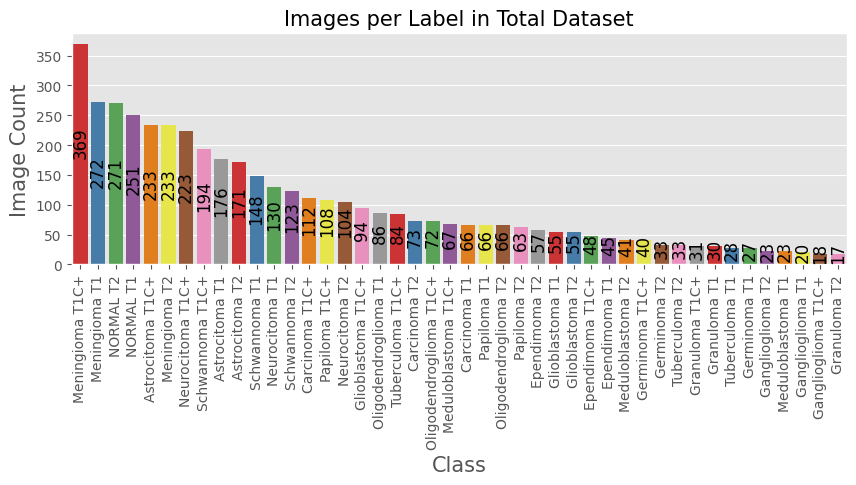

<Figure size 640x480 with 0 Axes>

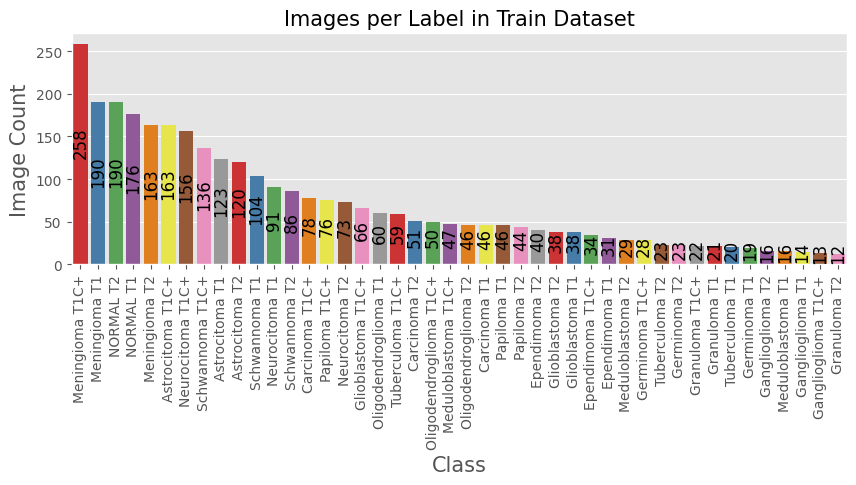

<Figure size 640x480 with 0 Axes>

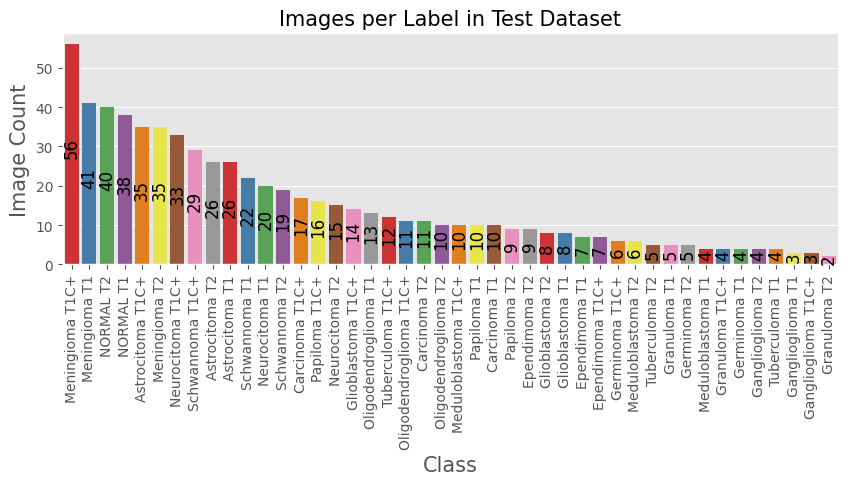

<Figure size 640x480 with 0 Axes>

In [ ]:
def show_images(gen):
    '''
    This function take the data generator and show sample of the images
    '''

    # return classes , images to be displayed
    g_dict = gen.class_indices        # defines dictionary {'class': index}
    classes = list(g_dict.keys())     # defines list of dictionary's kays (classes), classes names : string
    images, labels = next(gen)        # get a batch size samples from the generator

    # calculate number of displayed samples
    length = len(labels)        # length of batch size
    sample = min(length, 25)    # check if sample less than 25 images

    plt.figure(figsize= (20, 20))

    for i in range(sample):
        plt.subplot(5, 5, i + 1)
        image = images[i] / 255       # scales data to range (0 - 255)
        plt.imshow(image)
        index = np.argmax(labels[i])  # get image index
        class_name = classes[index]   # get class of image
        plt.title(class_name, color= 'blue', fontsize= 12)
        plt.axis('off')
    plt.show()

def plot_label_count(df, plot_title):
    '''
    This function take df and plot labels value counts
    '''

    # Define needed variables
    vcounts = df['label'].value_counts()
    labels = vcounts.keys().tolist()
    values = vcounts.tolist()
    lcount = len(labels)

    if lcount > 55:
        print('The number of labels is > 55, no plot will be produced')

    else:
        plot_labels(lcount, labels, values, plot_title)

def plot_labels(lcount, labels, values, plot_title):
    # width = lcount * 4
    # width = np.min([width, 20])
    # plt.figure(figsize= (width, 4))
    # form = { 'color': 'blue', 'size': 15}
    # plt.xlabel('CLASS', fontdict= form)
    # plt.ylabel(yaxis_label, fontdict= form)

    plt.figure(figsize= (10, 3),  dpi=100)  # Adjust figsize and DPI as needed)

    sns.barplot(x=labels, y=values, palette='Set1')
    # ax = sns.countplot(x=labels, palette='Set1')
    plt.xlabel('Class', fontsize= 15)
    plt.ylabel('Image Count', fontsize= 15)
    plt.title(f'Images per Label in {plot_title} Dataset', fontsize= 15)
    rotation = 'vertical' if lcount >= 8 else 'horizontal'
    plt.xticks(rotation= rotation)
    #plt.yticks(fontsize= 15)

    for i in range(lcount):
        plt.text(i, values[i] / 2, str(values[i]), fontsize= 12,
                rotation= rotation, color= 'black', ha= 'center')

    plt.show()
    plt.tight_layout()  # Adjust layout to prevent overlapping

plot_label_count(df, 'Total')
plot_label_count(train_df, 'Train')
plot_label_count(test_df, 'Test')

# **Load EfficientNetV2B3 Pre-trained Model**

By default, when loading a pre-trained model (such as EfficientNetV2M with ImageNet weights), the model layers are typically frozen (i.e., trainable = False).
base_model.trainable = True: This makes all layers of the base_model trainable, allowing the weights to be updated during training.  
Setting trainable = True unfreezes the entire base model, making all layers eligible for training or fine-tuning.

However, in the next part of the code, only certain layers of the model will actually be unfrozen for training.

#fine_tune_at = len(base_model.layers) - 20
#for layer in base_model.layers[:fine_tune_at]:
#    layer.trainable = False


Overall Purpose:
The code is performing partial fine-tuning:

*   The first (earlier) layers of the base model (before fine_tune_at) remain frozen (not trainable), meaning they will retain the pre-trained weights.
*   The last (deeper) 20 layers are unfrozen (trainable), meaning their weights will be updated during training to better adapt the model to the new dataset.


This is a common approach in transfer learning:


*   Early layers often capture more generic features like edges, textures, and simple shapes, which are useful across many different datasets. These layers are kept frozen to retain those general features.
*   Later layers capture more specific, task-oriented features and are fine-tuned to adapt the model to the new task or dataset.


In [ ]:
#https://www.kaggle.com/code/guanlintao/efficientnetv2-emotion-recognition
# Import the EfficientNetV2M model pre-trained on ImageNet without the top layers
base_model = tf.keras.applications.EfficientNetV2B3(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

# Add custom classification layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
output = Dense(44, activation='softmax')(x)  # 19 classes example

# Create a model that outputs both conv layer and final layer predictions
keras_model = Model(inputs=base_model.input, outputs=output)

#base_model.trainable = True  #Unfreeze Some Layers for Fine-Tuning

#fine_tune_at = len(base_model.layers) - 20
#for layer in base_model.layers[:fine_tune_at]:
#    layer.trainable = False

# Create  model
# keras_model = keras.models.Sequential()
# keras_model.add(tf.keras.Input(shape=(224, 224, 3)))
# keras_model.add(base_model)
# keras_model.add(keras.layers.GlobalAveragePooling2D())  # Replace Flatten with GlobalAveragePooling
# keras_model.add(keras.layers.BatchNormalization())  # Add a Batch Normalization Layer
# keras_model.add(keras.layers.Dense(128, activation='relu'))  # Increase the Model Capacity
# keras_model.add(keras.layers.Dropout(0.3))  # Reduce Regularization
# keras_model.add(keras.layers.Dense(44, activation=tf.nn.softmax))  # 17 output units for classification

# Display the model's architecture
keras_model.summary()

52606240/52606240 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling (Rescaling)     │ (None, 224, 224, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization             │ (None, 224, 224, 3)    │              0 │ rescaling[0][0]        │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 40)   │          1,080 │ normalization[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 40)   │            160 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 40)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_conv      │ (None, 112, 112, 16)   │          5,760 │ stem_activation[0][0]  │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_bn        │ (None, 112, 112, 16)   │             64 │ block1a_project_conv[… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_project_activati… │ (None, 112, 112, 16)   │              0 │ block1a_project_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_project_conv      │ (None, 112, 112, 16)   │          2,304 │ block1a_project_activ… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_project_bn        │ (None, 112, 112, 16)   │             64 │ block1b_project_conv[… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_project_activati… │ (None, 112, 112, 16)   │              0 │ block1b_project_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_drop (Dropout)    │ (None, 112, 112, 16)   │              0 │ block1b_project_activ… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1b_add (Add)         │ (None, 112, 112, 16)   │              0 │ block1b_drop[0][0],    │
│                           │                        │                │ block1a_project_activ… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2a_expand_conv  

 Total params: 14,549,610 (55.50 MB)

 Trainable params: 14,440,394 (55.09 MB)

 Non-trainable params: 109,216 (426.62 KB)

In [ ]:
last_conv_layer = None
for layer in keras_model.layers:
    if isinstance(layer, tf.keras.layers.Conv2D):
        last_conv_layer = layer

print("Last Convolutional Layer:", last_conv_layer.name)

Last Convolutional Layer: top_conv


In [ ]:
# Plot EfficientNetV2B3 model
#tf.keras.utils.plot_model(keras_model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=80)

In [ ]:
from tensorflow.keras.callbacks import CSVLogger

# Define the CSVLogger callback
csv_logger = CSVLogger('/content/drive/MyDrive/Brain_tumor_15/model/Feb17_braintumor44x_EnetV2B3_SampleNormCentered_Adam_NoAug_CAM_training_history.csv', append=True)  # Replace with desired path

# Add it to the callbacks list


# Define a checkpoint callback to save the best model

#save_weights_only=True in ModelCheckpoint, the filepath provided must end in .weights.h5 (Keras weights format)
# Set up ModelCheckpoint callback
def checkpoint_callback():
    checkpoint_filepath = '/content/drive/MyDrive/Brain_tumor_15/model/Feb17_braintumor44x_EnetV2B3_SampleNormCentered_Adam_NoAug_CAM.keras'
    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath,
                           save_weights_only=False,  # Save only the best weights
                           monitor='val_accuracy',
                           mode = 'max',          # 'max' because we are looking for max validation acc
                           save_best_only=True,
                           verbose=1)
    return model_checkpoint_callback

def early_stopping(patience):
    es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=True, verbose=1)
    return es_callback

def step_decay(epoch):
    initial_learning_rate = 0.001
    drop = 0.5  # The factor by which to drop the learning rate
    epochs_drop = 10  # Drop the learning rate after every 7 epochs
    lr = initial_learning_rate * (drop ** (epoch // epochs_drop))
    return lr

"""
class LearningRateLogger(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        # Get the current learning rate from the optimizer
        lr = self.model.optimizer.learning_rate
        # If the learning rate is a schedule, evaluate it
        if isinstance(lr, tf.keras.optimizers.schedules.LearningRateSchedule):
            lr = lr(self.model.optimizer.iterations)
        #print(f"Epoch {epoch + 1}: Learning rate is {lr.numpy()}")
        print(f"  Learning rate: {lr.numpy()}")
"""

early_stopping = early_stopping(patience=15)
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(step_decay)
checkpoint_callback = checkpoint_callback()
callbacks = [lr_scheduler, checkpoint_callback, early_stopping, csv_logger]


optimizer = tf.keras.optimizers.Adamax(learning_rate=0.001, weight_decay=1e-4)


keras_model.compile(optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

ModelCheckpoint
Callback to save the Keras model or model weights at some frequency.
ModelCheckpoint callback is used in conjunction with training using model.fit() to save a model or weights (in a checkpoint file) at some interval, so the model or weights can be loaded later to continue the training from the state saved.

EarlyStopping
Stop training when a monitored metric has stopped improving..

In [ ]:
#keras_model.compile(optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
#hist=keras_model.fit(train_gen,epochs=50,batch_size=32, validation_data=valid_gen,callbacks=[checkpoint,early_stopping])
#hist=keras_model.fit(train_gen,epochs=50,batch_size=32, validation_data=valid_gen,
#                     callbacks=[tf.keras.callbacks.LearningRateScheduler(step_decay),early_stopping])
#keras_model.compile(optimizer ='Adam',loss='categorical_crossentropy', metrics=['accuracy'])
#hist=keras_model.fit(train_gen,epochs=50,validation_data=valid_gen,callbacks=[checkpoint,early_stopping])


import pickle

hist = keras_model.fit(train_gen,epochs=50,batch_size=32, validation_data=valid_gen,callbacks= callbacks)

# Save the training history
history_path = '/content/drive/MyDrive/Brain_tumor_15/model/Feb17_braintumor44x_EnetV2B3_SampleNormCentered_Adam_NoAug_CAM.pickle'
with open(history_path, 'wb') as file_pi:
    pickle.dump(hist.history, file_pi)

Epoch 1/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.3281 - loss: 2.5999 
Epoch 1: val_accuracy improved from -inf to 0.36905, saving model to /content/drive/MyDrive/Brain_tumor_15/model/Feb17_braintumor44x_EnetV2B3_SampleNormCentered_Adam_NoAug_CAM.keras
98/98 ━━━━━━━━━━━━━━━━━━━━ 1475s 14s/step - accuracy: 0.3296 - loss: 2.5933 - val_accuracy: 0.3690 - val_loss: 2.2786 - learning_rate: 0.0010
Epoch 2/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - accuracy: 0.7515 - loss: 0.8264
Epoch 2: val_accuracy did not improve from 0.36905
98/98 ━━━━━━━━━━━━━━━━━━━━ 29s 291ms/step - accuracy: 0.7518 - loss: 0.8255 - val_accuracy: 0.3482 - val_loss: 2.2275 - learning_rate: 0.0010
Epoch 3/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - accuracy: 0.8978 - loss: 0.3477
Epoch 3: val_accuracy improved from 0.36905 to 0.44345, saving model to /content/drive/MyDrive/Brain_tumor_15/model/Feb17_braintumor44x_EnetV2B3_SampleNormCentered_Adam_NoAug_CAM.keras
98/98 ━━━━━━━━━━━━━━━━━━━━ 31s 317ms/step

In [ ]:
# import pickle

# # Load the training history from a pickle file
# history_path = '/content/drive/MyDrive/Brain_tumor_15/model/Feb16_braintumor44x_EnetB5_sampleNorm_Adam_NoAug_CAM.pickle'
# with open(history_path, 'rb') as f:
#     history = pickle.load(f)

# # Check the available keys in history
# print(history.keys())

# #Example: Plot training and validation loss
# #import matplotlib.pyplot as plt

#     # Plot training history
# plt.figure(figsize= (20, 8))
# plt.style.use('fivethirtyeight')
# plt.subplot(1, 2, 1)
# plt.plot(history['loss'], label='Training Loss')
# plt.plot(history['val_loss'], label='Validation Loss')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.legend()
# plt.title('Training History')
# plt.show()
# plt.subplot(1, 2, 2)
# plt.plot(history['accuracy'], label='Training Accuracy')
# plt.plot(history['val_accuracy'], label='Validation Accuracy')
# plt.xlabel('Epochs')
# plt.ylabel('Accuracy')
# plt.legend()
# plt.title('Training History')
# plt.show()

In [ ]:
# from tensorflow import keras

# # Load the trained model
# checkpoint_filepath = '/content/drive/MyDrive/Brain_tumor_15/model/Feb16_braintumor44x_EnetB5_sampleNorm_Adam_NoAug_CAM.ipynb.keras'

# # Load the model with custom objects
# keras_model = tf.keras.models.load_model(checkpoint_filepath)

In [ ]:
# Function to get true and predicted labels from the dataset
def plot_training(hist):
    '''
    This function take training model and plot history of accuracy and losses with the best epoch in both of them.
    '''

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']
    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]
    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    Epochs = [i+1 for i in range(len(tr_acc))]
    loss_label = f'best epoch= {str(index_loss + 1)}'
    acc_label = f'best epoch= {str(index_acc + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 8))
    plt.style.use('fivethirtyeight')

    plt.subplot(1, 2, 1)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout
    plt.show()



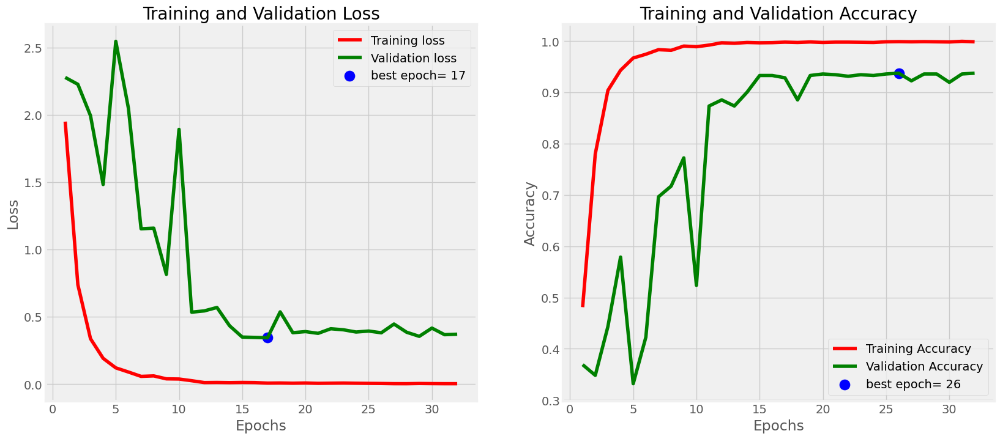

In [ ]:
plot_training(hist)

Evaluate on testing **dataset**

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = keras_model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = keras_model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = keras_model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 213ms/step - accuracy: 0.9982 - loss: 0.0068
12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 203ms/step - accuracy: 0.9163 - loss: 0.3831
12/12 ━━━━━━━━━━━━━━━━━━━━ 214s 19s/step - accuracy: 0.9462 - loss: 0.2342
Train Loss:  0.009830120950937271
Train Accuracy:  0.9947916865348816
--------------------
Validation Loss:  0.3920034170150757
Validation Accuracy:  0.9166666865348816
--------------------
Test Loss:  0.29746243357658386
Test Accuracy:  0.9330357313156128


# **Plot Confussion Matrix**

In [ ]:
y_pred = keras_model.predict(test_gen)

# Convert the predicted probabilities to class labels
y_pred_labels = np.argmax(y_pred, axis=1)

# Get the true class labels from the test data generator
y_true_labels = test_gen.classes

12/12 ━━━━━━━━━━━━━━━━━━━━ 13s 339ms/step


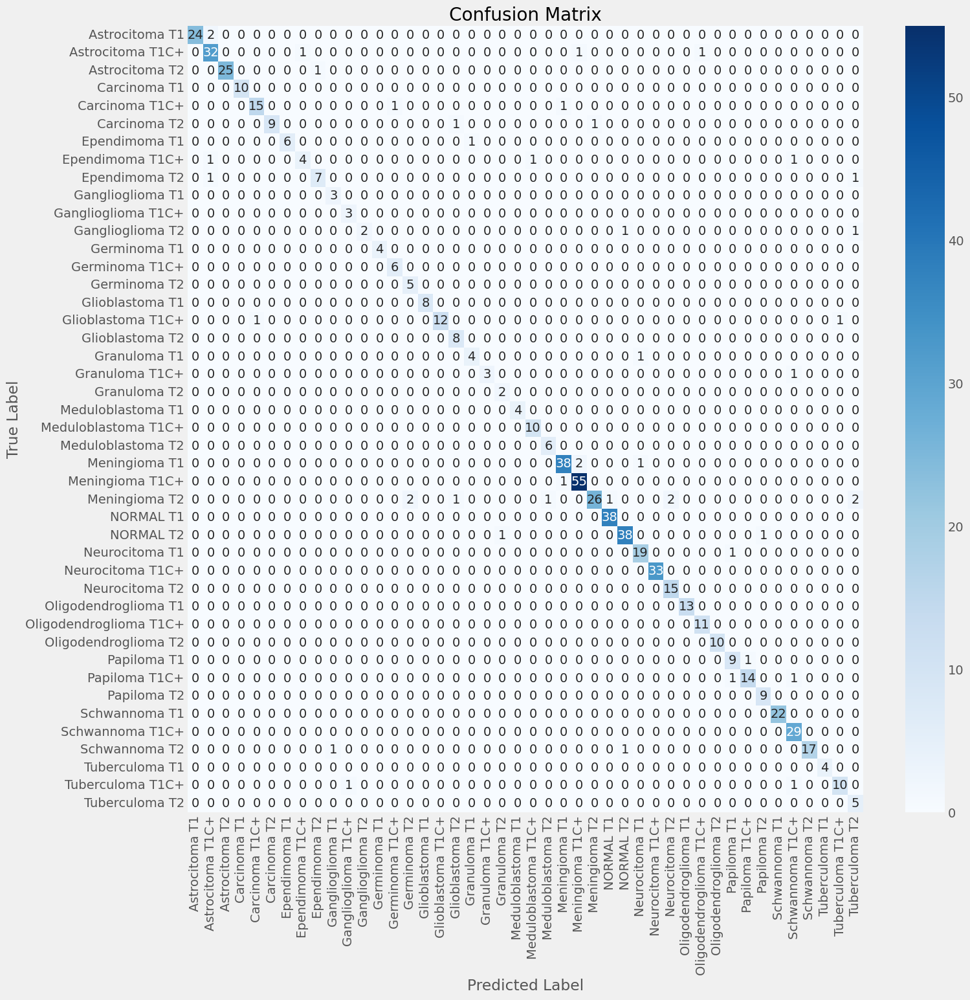

In [ ]:
# Get the class names from the generator
class_names = list(test_gen.class_indices.keys())

# Compute the confusion matrix
confusion_mtx = confusion_matrix(y_true_labels, y_pred_labels)


# Plot the confusion matrix using Seaborn heatmap
plt.figure(figsize=(15,15))
sns.heatmap(confusion_mtx, cmap="Blues", annot=True, fmt="d", xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Generate Classification **Report**

In [ ]:
import numpy as np


report = classification_report(y_true_labels, y_pred_labels, target_names=class_names, digits=4)


print("Classification Report: ")
print( report)

Classification Report: 
                        precision    recall  f1-score   support

        Astrocitoma T1     1.0000    0.9231    0.9600        26
      Astrocitoma T1C+     0.8889    0.9143    0.9014        35
        Astrocitoma T2     1.0000    0.9615    0.9804        26
          Carcinoma T1     1.0000    1.0000    1.0000        10
        Carcinoma T1C+     0.9375    0.8824    0.9091        17
          Carcinoma T2     1.0000    0.8182    0.9000        11
         Ependimoma T1     1.0000    0.8571    0.9231         7
       Ependimoma T1C+     0.8000    0.5714    0.6667         7
         Ependimoma T2     0.8750    0.7778    0.8235         9
      Ganglioglioma T1     0.7500    1.0000    0.8571         3
    Ganglioglioma T1C+     0.7500    1.0000    0.8571         3
      Ganglioglioma T2     1.0000    0.5000    0.6667         4
          Germinoma T1     1.0000    1.0000    1.0000         4
        Germinoma T1C+     0.8571    1.0000    0.9231         6
          Germi

In [ ]:
class_accuracy = confusion_mtx.diagonal() / confusion_mtx.sum(axis=1)

for i, accuracy in enumerate(class_accuracy):
    report += f"\n{class_names[i]} accuracy: {accuracy:.6f}"  # Format to 6 decimal places

print(report)

                        precision    recall  f1-score   support

        Astrocitoma T1     1.0000    0.9231    0.9600        26
      Astrocitoma T1C+     0.8889    0.9143    0.9014        35
        Astrocitoma T2     1.0000    0.9615    0.9804        26
          Carcinoma T1     1.0000    1.0000    1.0000        10
        Carcinoma T1C+     0.9375    0.8824    0.9091        17
          Carcinoma T2     1.0000    0.8182    0.9000        11
         Ependimoma T1     1.0000    0.8571    0.9231         7
       Ependimoma T1C+     0.8000    0.5714    0.6667         7
         Ependimoma T2     0.8750    0.7778    0.8235         9
      Ganglioglioma T1     0.7500    1.0000    0.8571         3
    Ganglioglioma T1C+     0.7500    1.0000    0.8571         3
      Ganglioglioma T2     1.0000    0.5000    0.6667         4
          Germinoma T1     1.0000    1.0000    1.0000         4
        Germinoma T1C+     0.8571    1.0000    0.9231         6
          Germinoma T2     0.7143    1.

12/12 ━━━━━━━━━━━━━━━━━━━━ 4s 346ms/step


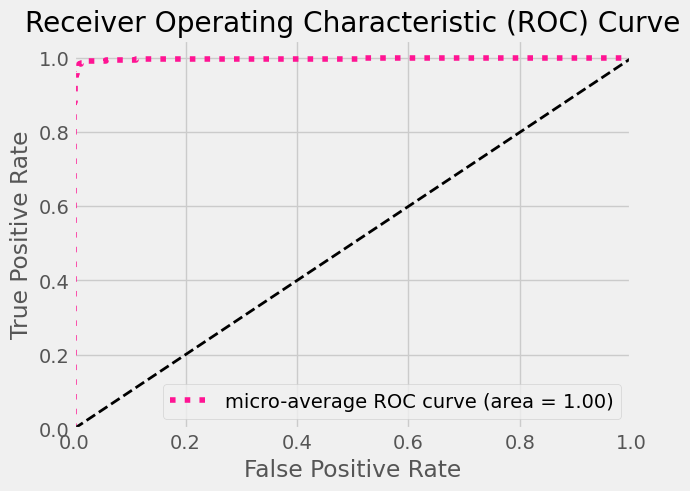

0.9983069414781418

In [ ]:
from tensorflow.keras import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize


# Binarize the true labels for multi-class ROC calculation
y_true_bin = label_binarize(y_true_labels, classes=np.unique(y_true_labels))
n_classes = y_true_bin.shape[1]  # Number of classes

# Get prediction probabilities instead of predicted labels
y_pred_prob = keras_model.predict(test_gen)

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_pred_prob.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot the micro-average ROC curve
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

# Plot ROC curves for each class (optional)
# for i in range(n_classes):
#     plt.plot(fpr[i], tpr[i], lw=2,
#              label='ROC curve of class {0} (area = {1:0.2f})'
#              ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Get the micro-average AUC value
auc_value = roc_auc["micro"]  # Access the AUC value directly
auc_value

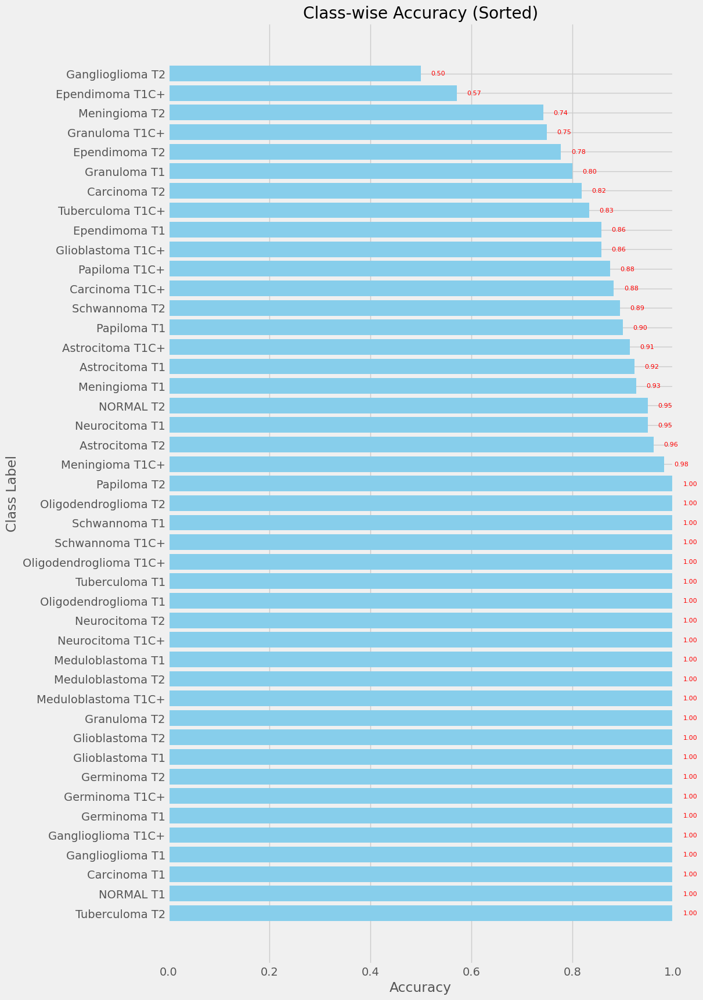

In [ ]:
# Calculate accuracy for each class
class_accuracies = np.diag(confusion_mtx) / np.sum(confusion_mtx, axis=1)

# Sort class accuracies and corresponding class labels
sorted_indices = np.argsort(class_accuracies)[::-1]  # Indices of accuracies in descending order
sorted_class_names = np.array(class_names)[sorted_indices]  # Assign to a single variable
sorted_class_accuracies = class_accuracies[sorted_indices]

# Plot class accuracies
plt.figure(figsize=(10, 20))
bars = plt.barh(sorted_class_names, sorted_class_accuracies, color='skyblue')
plt.xlabel('Accuracy')
plt.ylabel('Class Label')
plt.title('Class-wise Accuracy (Sorted)')
plt.xlim(0, 1)  # Accuracy ranges from 0 to 1

# Add the accuracy values outside the bars, vertically centered
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.02, bar.get_y() + bar.get_height() / 2, f'{width:.2f}',
             va='center', ha='left', fontsize=8, color='red')

plt.show()

In [ ]:
# loss, acc = keras_model.evaluate(valid_gen)
# print('validation Loss =', loss)
# print('validation Accuracy =', acc)

In [ ]:
# hist_=pd.DataFrame(history)
# hist_

In [ ]:

# # Plot confusion matrix with raw counts
# plt.figure(figsize=(10, 10))
# sns.heatmap(confusion_mtx, annot=True, fmt='d', cmap='Blues',  # 'd' for integer format
#             xticklabels=class_names, yticklabels=class_names)
# plt.xlabel('Predicted Label')  # X-axis label
# plt.ylabel('True Label')  # Y-axis label
# plt.title('Confusion Matrix')  # Title of the plot
# plt.show()  # Display the plot

In [ ]:
# loss, acc = keras_model.evaluate(train_gen)
# print('train Loss =', loss)
# print('train Accuracy =', acc)
# loss, acc = keras_model.evaluate(valid_gen)
# print('validation Loss =', loss)
# print('validation Accuracy =', acc)
# loss, acc = keras_model.evaluate(test_gen)
# print('test Loss =', loss)
# print('test Accuracy =', acc)

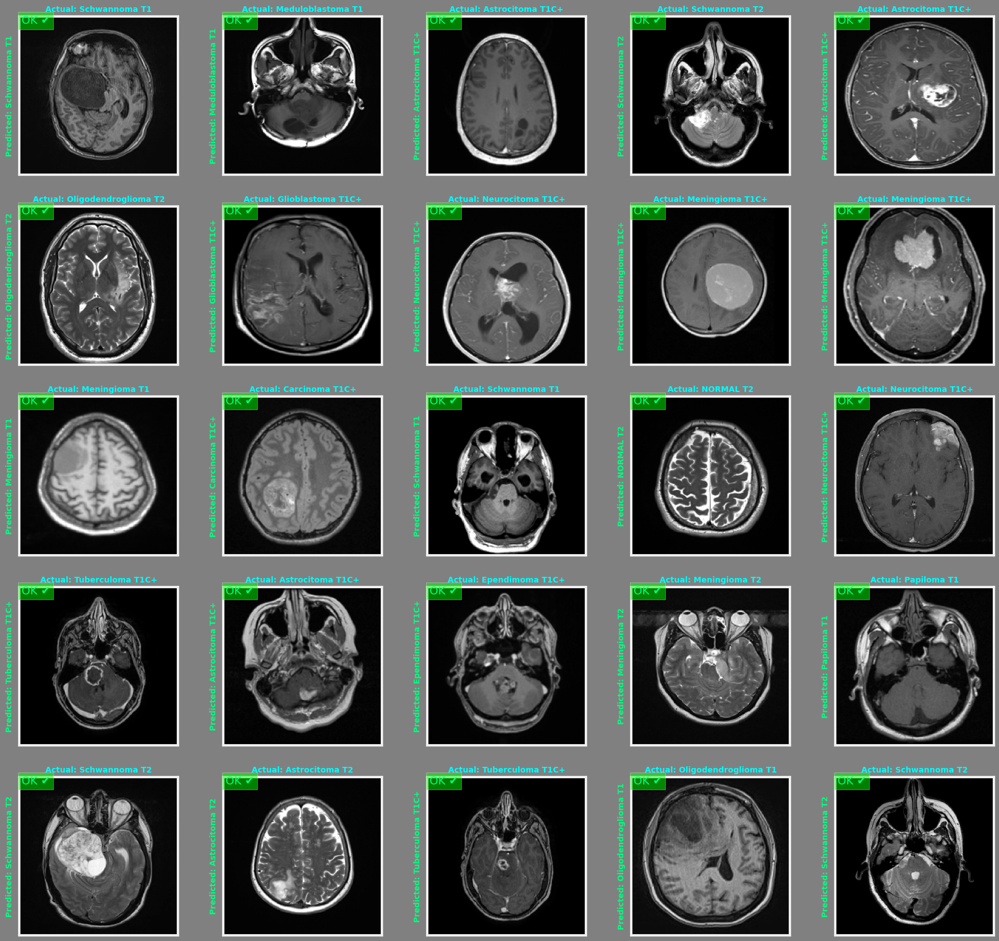

In [ ]:
plt.figure(figsize=(20, 20), facecolor="gray")

# Get one batch of data
images, labels = next(test_gen)

for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    img = images[i] - images[i].min()  # Shift to make min = 0
    img = img / ((images[i].max()-images[i].min() )+ 1e-10)  # Normalize to [0,1]
    plt.imshow(img)
    predictions = keras_model.predict(tf.expand_dims(images[i], 0), verbose=0)
    score = tf.nn.softmax(predictions[0])
    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="aqua", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="springgreen", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="aqua", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt


class ClassActivationMapper:
    def __init__(self, model, last_conv_layer_name):
        self.model = model
        self.last_conv_layer_name = last_conv_layer_name
        self.grad_model = tf.keras.models.Model(
            [self.model.inputs],
            [self.model.get_layer(last_conv_layer_name).output, self.model.output]
        )

    def generate_cam(self, img, class_index, alpha=0.5, threshold = 0.5):
        # Get predictions and gradients
        img_tensor = np.expand_dims(img, axis=0)
        with tf.GradientTape() as tape:
            conv_outputs, predictions = self.grad_model(img_tensor)
            loss = predictions[:, class_index]

        grads = tape.gradient(loss, conv_outputs)
        pooled_grads = tf.reduce_sum(grads, axis=(0, 1, 2)).numpy()
        conv_outputs = conv_outputs.numpy()[0]

        # Weight the channels by corresponding gradients
        for i in range(len(pooled_grads)):
            conv_outputs[:, :, i] *= pooled_grads[i]

        # Generate heatmap
        heatmap = np.mean(conv_outputs, axis=-1)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap) + 1e-10

        # Resize heatmap to match input image size
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

        # Apply threshold to keep background black
        #threshold = 0.2  # Adjust this value to control how much activation is shown
        heatmap[heatmap < threshold] = 0

        # Convert heatmap to colored version
        heatmap_uint8 = np.uint8(255 * heatmap)
        heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
        heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

        # Make background black
        heatmap_colored[heatmap_uint8 == 0] = [0, 0, 0]

        # Convert input image to RGB (3 channels)
        if len(img.shape) == 2:
            img_rgb = np.stack([img] * 3, axis=-1)
        else:
            img_rgb = img

        if img_rgb.max() > 1.0 or img_rgb.min() < 0:

            img_rgb = img_rgb - img_rgb.min()  # Shift to make min = 0
            img_rgb = img_rgb / (img_rgb.max()-img_rgb.min() + 1e-10)  # Normalize to [0,1]
            img_rgb = (img_rgb * 255).astype(np.uint8)  # Convert to [0,255]

        # Scale image to 0-255 if needed
        if img_rgb.max() <= 1.0:
            img_rgb = (img_rgb * 255).astype(np.uint8)
        else:
            img_rgb = img_rgb.astype(np.uint8)

        # Create the overlay
        overlay = cv2.addWeighted(img_rgb, 1.0, heatmap_colored, alpha, 0)

        return overlay, predictions

def visualize_cam(model, class_names, img, conv_layer_name, alpha, threshold):
    cam_mapper = ClassActivationMapper(model, conv_layer_name)

    # Get predictions
    predictions = model.predict(np.expand_dims(img, axis=0))
    predicted_class = np.argmax(predictions)

    # print("\nTop 1 prediction:")
    # top_indices = tf.argsort(predictions[0], direction='DESCENDING')[:1]
    # for idx in top_indices:
    #     print(f"{class_names[idx.numpy()]}: {predictions[0][idx.numpy()]:.3f}")

    # Generate CAM
    cam_image, _ = cam_mapper.generate_cam(img, predicted_class, alpha, threshold)

    return cam_image



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


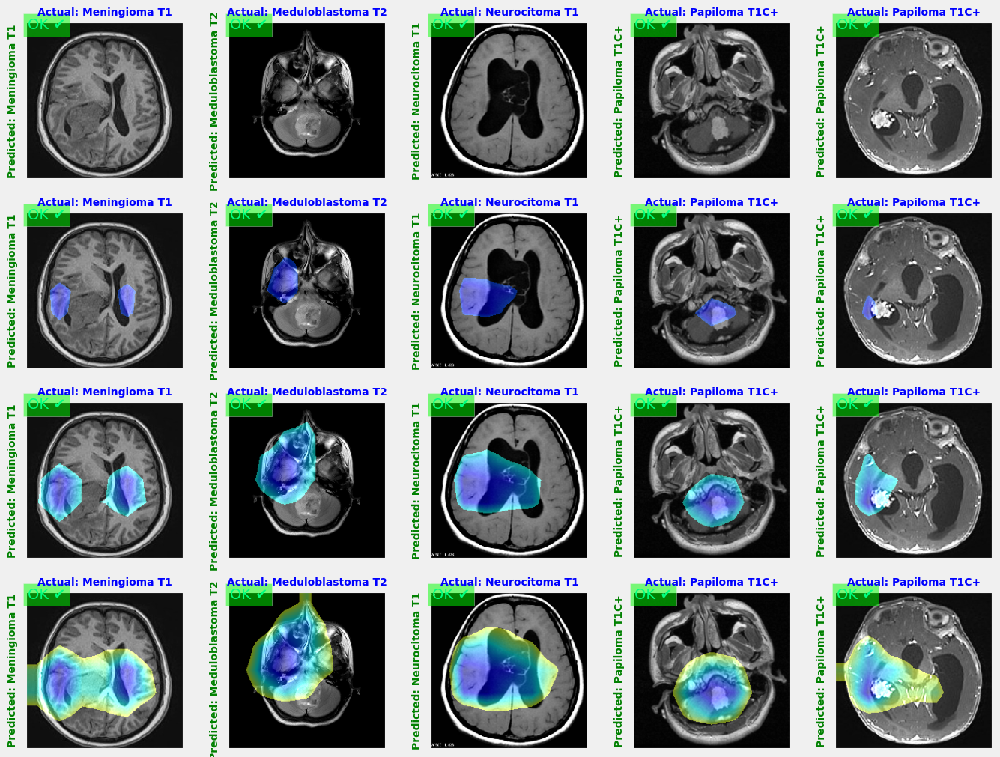

In [ ]:
i# Get one batch of data
images, labels = next(test_gen)
plt.figure(figsize=(15, 12))


for i in range(5):
    ax = plt.subplot(4, 5, i + 1)
    predictions = keras_model.predict(tf.expand_dims(images[i], 0), verbose=0)
    score = tf.nn.softmax(predictions[0])
    img = images[i] - images[i].min()  # Shift to make min = 0
    img = img / ((images[i].max()-images[i].min() )+ 1e-10)  # Normalize to [0,1]
    plt.imshow(img)
    # Generate and plot CAM
    predicted_class = np.argmax(predictions)

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])

    # print(f"\n i={i} -- Top 1 predictions:")
    # top_indices = tf.argsort(predictions[0], direction='DESCENDING')[:1]
    # for idx in top_indices:
    #     print(f"{class_names[idx.numpy()]}: {predictions[0][idx.numpy()]:.3f}")

    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 5+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.8)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 10+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.6)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 15+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.4)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


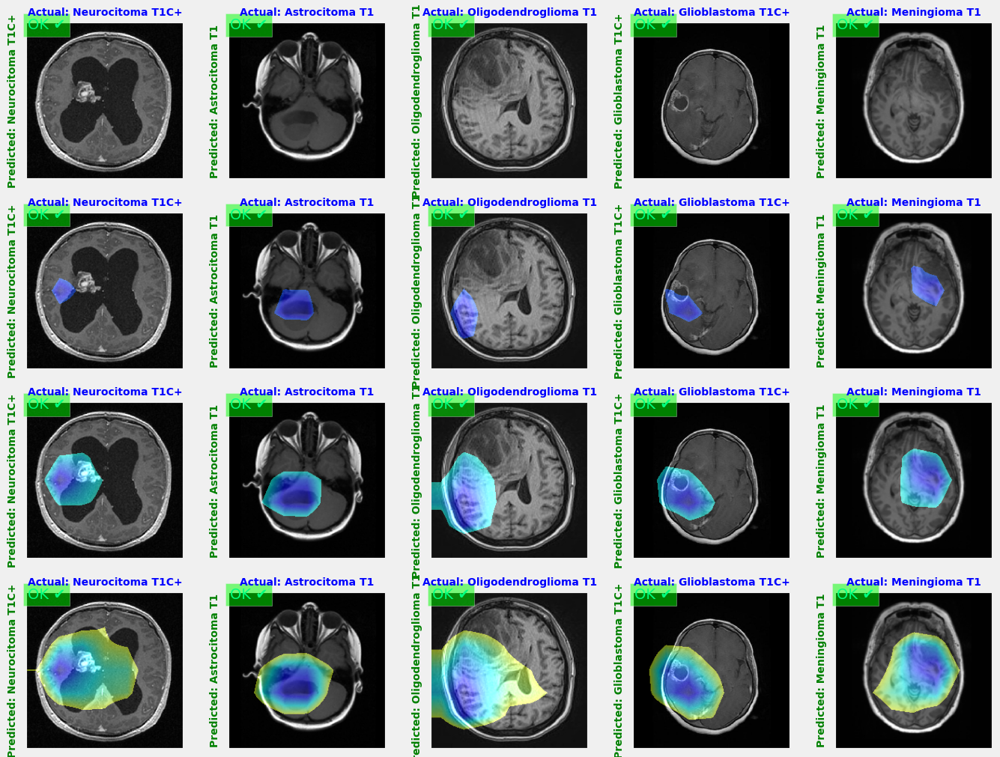

In [ ]:
i# Get one batch of data
images, labels = next(test_gen)
plt.figure(figsize=(15, 12))


for i in range(5):
    ax = plt.subplot(4, 5, i + 1)
    predictions = keras_model.predict(tf.expand_dims(images[i], 0), verbose=0)
    score = tf.nn.softmax(predictions[0])
    img = images[i] - images[i].min()  # Shift to make min = 0
    img = img / ((images[i].max()-images[i].min() )+ 1e-10)  # Normalize to [0,1]
    plt.imshow(img)
    # Generate and plot CAM
    predicted_class = np.argmax(predictions)

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])

    # print(f"\n i={i} -- Top 1 predictions:")
    # top_indices = tf.argsort(predictions[0], direction='DESCENDING')[:1]
    # for idx in top_indices:
    #     print(f"{class_names[idx.numpy()]}: {predictions[0][idx.numpy()]:.3f}")

    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 5+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.8)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 10+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.6)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 15+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.4)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


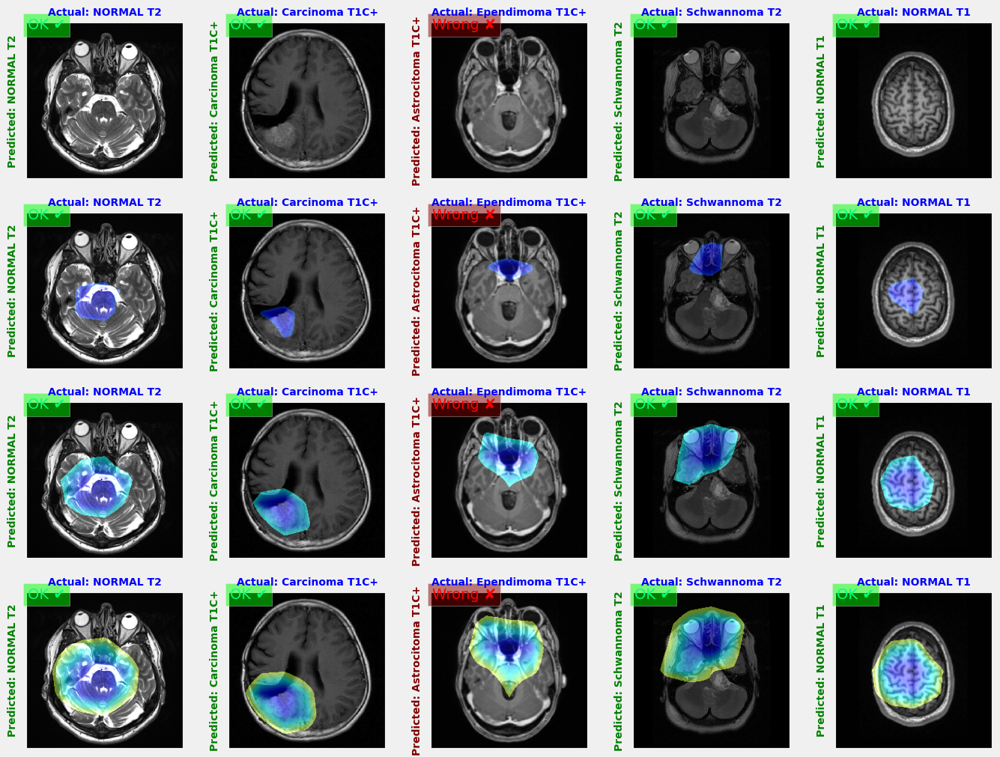

In [ ]:
i# Get one batch of data
images, labels = next(test_gen)
plt.figure(figsize=(15, 12))


for i in range(5):
    ax = plt.subplot(4, 5, i + 1)
    predictions = keras_model.predict(tf.expand_dims(images[i], 0), verbose=0)
    score = tf.nn.softmax(predictions[0])
    img = images[i] - images[i].min()  # Shift to make min = 0
    img = img / ((images[i].max()-images[i].min() )+ 1e-10)  # Normalize to [0,1]
    plt.imshow(img)
    # Generate and plot CAM
    predicted_class = np.argmax(predictions)

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])

    # print(f"\n i={i} -- Top 1 predictions:")
    # top_indices = tf.argsort(predictions[0], direction='DESCENDING')[:1]
    # for idx in top_indices:
    #     print(f"{class_names[idx.numpy()]}: {predictions[0][idx.numpy()]:.3f}")

    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 5+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.8)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 10+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.6)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 15+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.4)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


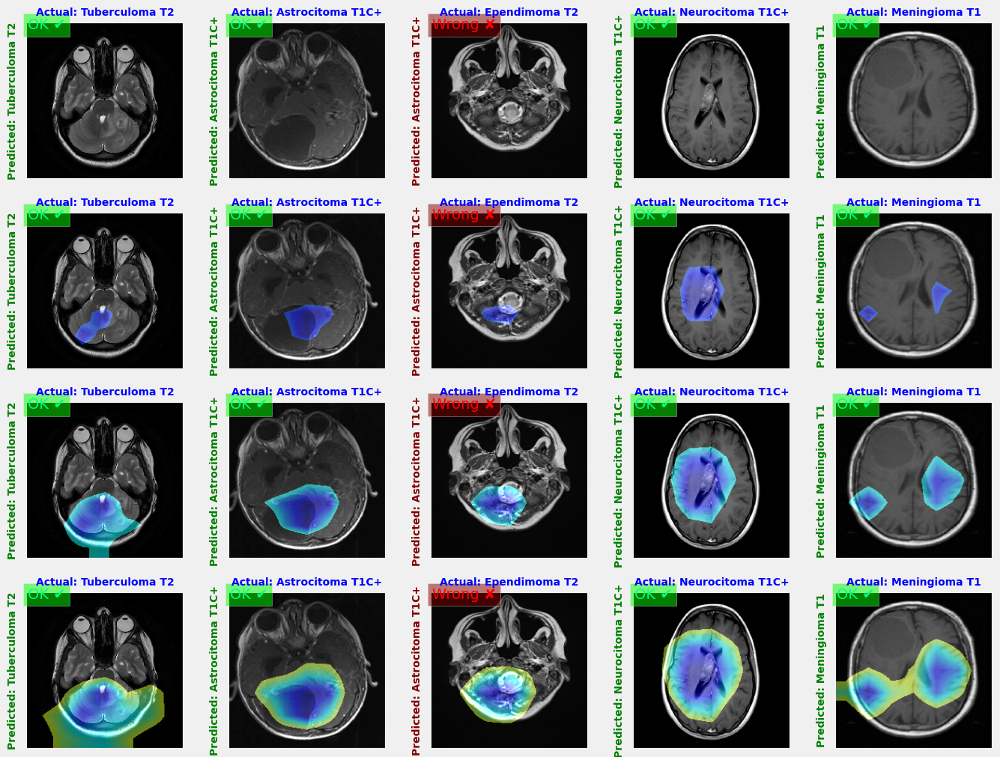

In [ ]:
i# Get one batch of data
images, labels = next(test_gen)
plt.figure(figsize=(15, 12))


for i in range(5):
    ax = plt.subplot(4, 5, i + 1)
    predictions = keras_model.predict(tf.expand_dims(images[i], 0), verbose=0)
    score = tf.nn.softmax(predictions[0])
    img = images[i] - images[i].min()  # Shift to make min = 0
    img = img / ((images[i].max()-images[i].min() )+ 1e-10)  # Normalize to [0,1]
    plt.imshow(img)
    # Generate and plot CAM
    predicted_class = np.argmax(predictions)

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])

    # print(f"\n i={i} -- Top 1 predictions:")
    # top_indices = tf.argsort(predictions[0], direction='DESCENDING')[:1]
    # for idx in top_indices:
    #     print(f"{class_names[idx.numpy()]}: {predictions[0][idx.numpy()]:.3f}")

    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 5+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.8)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 10+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.6)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 15+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.4)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


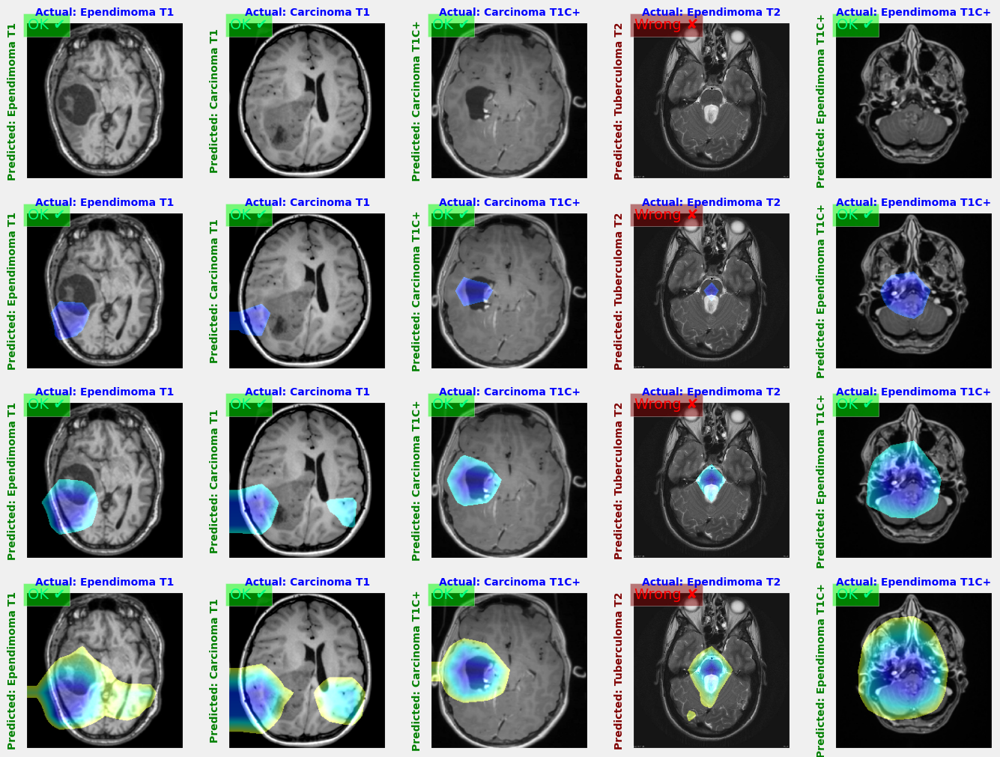

In [ ]:
i# Get one batch of data
images, labels = next(test_gen)
plt.figure(figsize=(15, 12))


for i in range(5):
    ax = plt.subplot(4, 5, i + 1)
    predictions = keras_model.predict(tf.expand_dims(images[i], 0), verbose=0)
    score = tf.nn.softmax(predictions[0])
    img = images[i] - images[i].min()  # Shift to make min = 0
    img = img / ((images[i].max()-images[i].min() )+ 1e-10)  # Normalize to [0,1]
    plt.imshow(img)
    # Generate and plot CAM
    predicted_class = np.argmax(predictions)

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])

    # print(f"\n i={i} -- Top 1 predictions:")
    # top_indices = tf.argsort(predictions[0], direction='DESCENDING')[:1]
    # for idx in top_indices:
    #     print(f"{class_names[idx.numpy()]}: {predictions[0][idx.numpy()]:.3f}")

    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 5+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.8)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 10+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.6)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

    ax = plt.subplot(4, 5, i + 15+ 1)

    cam_image = visualize_cam(keras_model, class_names, images[i], last_conv_layer.name, alpha=0.5, threshold = 0.4)
    plt.imshow(cv2.cvtColor(cam_image, cv2.COLOR_BGR2RGB))

    # Convert labels[i] to a scalar index by taking the argmax
    true_label_index = np.argmax(labels[i])
    if(class_names[true_label_index]==class_names[np.argmax(score)]):
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="green", fontweight="bold", fontsize=10)
        ok_text = plt.text(2, 10, "OK \u2714", color="springgreen", fontsize=14)
        ok_text.set_bbox(dict(facecolor='lime', alpha=0.5))

    else:
        plt.title("Actual: "+class_names[true_label_index], color="blue", fontweight="bold", fontsize=10)
        plt.ylabel("Predicted: "+class_names[np.argmax(score)], color="maroon", fontweight="bold", fontsize=10)
        nok_text = plt.text(2, 10, "Wrong \u2718", color="red", fontsize=14)
        nok_text.set_bbox(dict(facecolor='maroon', alpha=0.5))
    plt.gca().axes.yaxis.set_ticklabels([])
    plt.gca().axes.xaxis.set_ticklabels([])
    plt.grid(False) # remove the grid

In [ ]:
# Load the saved weights
# checkpoint_filepath = '/content/drive/MyDrive/Brain_tumor_15/model/Jan12_braintumor44x_EnetV2B3_featureNorm_NoAug.weights.h5'
# keras_model.load_weights(checkpoint_filepath)

# checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath,
#                            save_weights_only=True,  # Save only the best weights
#                            monitor='val_accuracy',
#                            mode = 'max',          # 'max' because we are looking for max validation acc
#                            save_best_only=True,
#                            verbose=1)


# callbacks = [lr_scheduler, checkpoint, early_stopping, csv_logger] #replaced checkpoint

# hist_resume = keras_model.fit(train_gen,
#                               epochs=22,  # Total epochs you want to train
#                               initial_epoch=21,  # Start from where it left off
#                               batch_size=32,
#                               validation_data=valid_gen,
#                               callbacks=callbacks)
# hist = hist_resume

In [ ]:
# # Access the base EfficientNetV2-B3 model
# # Load the saved EfficientNetV2-B3 model
# checkpoint_filepath = '/content/drive/MyDrive/Brain_tumor_15/model/Jan12_braintumor44x_EnetV2B3_featureNorm_NoAug.weights.h5'
# keras_model.load_weights(checkpoint_filepath)



In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt


class ClassActivationMapper_max:
    def __init__(self, model, last_conv_layer_name):
        self.model = model
        self.last_conv_layer_name = last_conv_layer_name
        self.grad_model = tf.keras.models.Model(
            [self.model.inputs],
            [self.model.get_layer(last_conv_layer_name).output, self.model.output]
        )

    def generate_cam(self, img, class_index, alpha=0.5, threshold = 0.5):
        # Get predictions and gradients
        img_tensor = np.expand_dims(img, axis=0)
        with tf.GradientTape() as tape:
            conv_outputs, predictions = self.grad_model(img_tensor)
            loss = predictions[:, class_index]

        grads = tape.gradient(loss, conv_outputs)
        pooled_grads = tf.reduce_max(grads, axis=(0, 1, 2)).numpy()
        conv_outputs = conv_outputs.numpy()[0]

        # Weight the channels by corresponding gradients
        for i in range(len(pooled_grads)):
            conv_outputs[:, :, i] *= pooled_grads[i]

        # Generate heatmap
        heatmap = np.mean(conv_outputs, axis=-1)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap) + 1e-10

        # Resize heatmap to match input image size
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

        # Apply threshold to keep background black
        #threshold = 0.2  # Adjust this value to control how much activation is shown
        heatmap[heatmap < threshold] = 0

        # Convert heatmap to colored version
        heatmap_uint8 = np.uint8(255 * heatmap)
        heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
        heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

        # Make background black
        heatmap_colored[heatmap_uint8 == 0] = [0, 0, 0]

        # Convert input image to RGB (3 channels)
        if len(img.shape) == 2:
            img_rgb = np.stack([img] * 3, axis=-1)
        else:
            img_rgb = img

        # Scale image to 0-255 if needed
        if img_rgb.max() <= 1.0:
            img_rgb = (img_rgb * 255).astype(np.uint8)
        else:
            img_rgb = img_rgb.astype(np.uint8)

        # Create the overlay
        overlay = cv2.addWeighted(img_rgb, 1.0, heatmap_colored, alpha, 0)

        return overlay, predictions

def visualize_cam_max(model, class_names, img, conv_layer_name, alpha, threshold):
    cam_mapper = ClassActivationMapper_max(model, conv_layer_name)

    # Get predictions
    predictions = model.predict(np.expand_dims(img, axis=0))
    predicted_class = np.argmax(predictions)

    # print("\nTop 1 prediction:")
    # top_indices = tf.argsort(predictions[0], direction='DESCENDING')[:1]
    # for idx in top_indices:
    #     print(f"{class_names[idx.numpy()]}: {predictions[0][idx.numpy()]:.3f}")

    # Generate CAM
    cam_image, _ = cam_mapper.generate_cam(img, predicted_class, alpha, threshold)

    return cam_image

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt


class ClassActivationMapper_min:
    def __init__(self, model, last_conv_layer_name):
        self.model = model
        self.last_conv_layer_name = last_conv_layer_name
        self.grad_model = tf.keras.models.Model(
            [self.model.inputs],
            [self.model.get_layer(last_conv_layer_name).output, self.model.output]
        )

    def generate_cam(self, img, class_index, alpha=0.5, threshold = 0.5):
        # Get predictions and gradients
        img_tensor = np.expand_dims(img, axis=0)
        with tf.GradientTape() as tape:
            conv_outputs, predictions = self.grad_model(img_tensor)
            loss = predictions[:, class_index]

        grads = tape.gradient(loss, conv_outputs)
        pooled_grads = tf.reduce_min(grads, axis=(0, 1, 2)).numpy()
        conv_outputs = conv_outputs.numpy()[0]

        # Weight the channels by corresponding gradients
        for i in range(len(pooled_grads)):
            conv_outputs[:, :, i] *= pooled_grads[i]

        # Generate heatmap
        heatmap = np.mean(conv_outputs, axis=-1)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap) + 1e-10

        # Resize heatmap to match input image size
        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

        # Apply threshold to keep background black
        #threshold = 0.2  # Adjust this value to control how much activation is shown
        heatmap[heatmap < threshold] = 0

        # Convert heatmap to colored version
        heatmap_uint8 = np.uint8(255 * heatmap)
        heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
        heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

        # Make background black
        heatmap_colored[heatmap_uint8 == 0] = [0, 0, 0]

        # Convert input image to RGB (3 channels)
        if len(img.shape) == 2:
            img_rgb = np.stack([img] * 3, axis=-1)
        else:
            img_rgb = img

        # Scale image to 0-255 if needed
        if img_rgb.max() <= 1.0:
            img_rgb = (img_rgb * 255).astype(np.uint8)
        else:
            img_rgb = img_rgb.astype(np.uint8)

        # Create the overlay
        overlay = cv2.addWeighted(img_rgb, 1.0, heatmap_colored, alpha, 0)

        return overlay, predictions

def visualize_cam_min(model, class_names, img, conv_layer_name, alpha, threshold):
    cam_mapper = ClassActivationMapper_min(model, conv_layer_name)

    # Get predictions
    predictions = model.predict(np.expand_dims(img, axis=0))
    predicted_class = np.argmax(predictions)

    # print("\nTop 1 prediction:")
    # top_indices = tf.argsort(predictions[0], direction='DESCENDING')[:1]
    # for idx in top_indices:
    #     print(f"{class_names[idx.numpy()]}: {predictions[0][idx.numpy()]:.3f}")

    # Generate CAM
    cam_image, _ = cam_mapper.generate_cam(img, predicted_class, alpha, threshold)

    return cam_image